Can you automatically bleep someone on TV when they swear?

Lately I've been watching a lot of comedy clips on youtube. And unless it's on [comedy central](https://www.reddit.com/r/IASIP/comments/18s4kn/why_the_hell_does_comedy_central_have_to_censor/) they are usually uncensored. 

But the clips on comedy central got me thinking. Could we train a deep learning model to:
1. Recognise when someone swears
2. Automatically bleep the swear word out

It's an interesting idea. And I stupidly thought it would be easy. It did not turn out to be easy at all.



Audio classification has been getting a lot of [attention](https://www.kaggle.com/c/birdsong-recognition/overview) on kaggle. But so far it's been focused on short audio samples (less than a few seconds).

I couldn't find a lot of information out there on longer audio samples. 

So in this article I'll describe my initial attempt at this idea. 

I'll be borrowing ideas and code from a [pytorch tutorial](https://pytorch.org/tutorials/intermediate/speech_command_recognition_with_torchaudio.html) and the [fastaudio](https://github.com/fastaudio/fastaudio) repository. 

First we'll need to install a few things

In [1]:
!pip install -q torch==1.7.0+cu101 torchvision==0.8.1+cu101 torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install -q -U fastai fastcore pydub ffmpy

     |████████████████████████████████| 7.6MB 7.6MB/s 
     |████████████████████████████████| 194kB 13.0MB/s 
     |████████████████████████████████| 61kB 6.1MB/s 


I really like `ipython-autotime`. It automatically lets me know how long cells take to run. So there's no need to run a `%%time` in each cell. 

I'll be using this library in this notebook.

In [ ]:
# install ipython automtime. I love this tool.
!pip install ipython-autotime
%load_ext autotime

In [49]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchaudio
import matplotlib.pyplot as plt
import IPython.display as ipd
from tqdm.notebook import tqdm

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu
time: 83.8 ms


# Create Datasets

First we'll need to create a dataset.

After a lot of searching I managed to find a swear word dataset that was somewhat suitable for my purposes. I'll be using a dataset from [`the abuse project`](https://github.com/theabuseproject/tapad) which is available on github.

In [5]:
!git clone https://github.com/theabuseproject/tapad swear_words

Cloning into 'swear_words'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 52900 (delta 0), reused 0 (delta 0), pack-reused 52896
Receiving objects: 100% (52900/52900), 160.90 MiB | 16.17 MiB/s, done.
Resolving deltas: 100% (4091/4091), done.
Checking out files: 100% (26376/26376), done.
time: 15.8 s


In [ ]:
# %%time
import glob
from pydub import AudioSegment
from pathlib import Path
import os
from fastcore.parallel import parallel
import mulitprocessing as mp

# we have to covnert the swear words dataset to wave files for the tensor sizes to match during training and infeerence
# use the pydub library to do that
# use parallel processing in fastai to speed things up

def convert_mp3_to_wav(file):
  parent = Path(file).parent.name
  file_name = Path(file).stem + '.wav'
  mp3 = AudioSegment.from_mp3(file)
  output = Path(dir).parents[1]/parent/file_name
  # print(output)
  os.remove(file)
  if Path(output).exists(): os.remove(output)
  mp3.export(output, format="wav")

dir = 'swear_words/audio/en*/*.mp3' # only english swear words
files = glob.glob(dir)
parallel(convert_mp3_to_wav, files, n_workers = mp.cpu_count())

In [161]:
swear_words = glob.glob(dir.replace('mp3', 'wav')); len(swear_words)

4511

In [165]:
# check dataset is ok
import random
file = random.choice(swear_words)
waveform, sample_rate = torchaudio.load(file)
ipd.Audio(waveform, rate = sample_rate)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Next I found a dataset that had "clean" audio. By clean I mean audio without swear words in it. I'll be using the [speech commands dataset](https://www.tensorflow.org/datasets/catalog/speech_commands) from google.

In [156]:
from torchaudio.datasets import SPEECHCOMMANDS

class dataset_creator(SPEECHCOMMANDS):
    def __init__(self): super().__init__("./", download=True)
        
dataset_creator()

I'm sure there are better datasets out there. Please let me know if you've found a better one.

# Organise Data

As you can imagine there's a lot of data prep involved. 

We'll combine the audio from swear word dataset with the audio from the speech commands dataset. Then we'll group them into `train` and `test` folders. 

To make things really easy, we'll also create a `train_df` dataframe and a `test_df` dataframe. This will contain the name of each audio file and swear word tracker. A `1` means that this file contains a swear word. A `0` means this file does not have a swear word.


The following code accomplishes all of that

In [157]:
import pandas as pd
import shutil
import multiprocessing as mp # https://cslocumwx.github.io/blog/2015/02/23/python-multiprocessing/

clean_words = glob.glob('SpeechCommands/speech_commands_v0.02/*/*.wav')


def get_label(filepath):
  if 'speech_commands' in str(filepath): # Todo: get rid of string matching solution. Something better?
    # print(f'{filepath} contains no swear words')
    return 0 # contains no swear words
  else:
    # print(f'{filepath} contains swear words')
    return 1 # contains swear words

def get_name(filepath):
  if 'speech_commands' in str(filepath):
    name = str(Path(filepath).parent.name)
  else:
    name = str(Path(filepath).stem)
  return name

def _get_train_test(data, split = 0.8):
  random.shuffle(data)
  train_length = int(len(data) * 0.8)
  train_data = data[:train_length]
  test_data = data[train_length:]
  return train_data, test_data

def _delete_recreate(text): 
  if Path(text).exists(): shutil.rmtree(text)
  os.mkdir(text)

def _get_output_name(file, dir):
  file_name = get_name(file) + str(Path(file).suffix)
  output = Path(dir)/file_name
  return output

def _copy_across(file, dir):
  shutil.copyfile(file, _get_output_name(file, dir))

def _copy_across_and_create_df(dir, data):
  print(f'preparing {dir} folder...')
  df = pd.DataFrame({'file_name': [_get_output_name(i, dir) for i in data], \
                      'target': [get_label(i) for i in data]})
  # if resample: parallel(_resample, data, dir = dir, sr = 16000, n_workers = mp.cpu_count()) 
  parallel(_copy_across, data, dir = dir, n_workers = mp.cpu_count()) # use parallel processing to speed things up
  return df

Now we'll use the helper functions to create the train and test datasets. 

In [158]:
def create_train_test(split = 0.8):

  if Path('train.csv').exists() and Path('test.csv').exists(): 
    return pd.read_csv('train.csv'), pd.read_csv('test.csv')

  _delete_recreate('test')
  _delete_recreate('train')

  train_data, test_data = _get_train_test(swear_words + clean_words, split)

  train_df = _copy_across_and_create_df('train', train_data)
  test_df = _copy_across_and_create_df('test', test_data)

  return train_df, test_df

train_df, test_df = create_train_test(0.8)
train_df.head()

,file_name,target
0,train/down.wav,0
1,train/forward.wav,0
2,train/house.wav,0
3,train/left.wav,0
4,train/seven.wav,0


I've used multiprocessing here to really speed things up. The `parallel` function from [`fastcore`](https://fastcore.fast.ai/parallel.html#parallel) is incredibly useful and saves me a lot of time.


In [14]:
train_df['target'].value_counts()

0    84706
1     3570
Name: target, dtype: int64

In [15]:
test_df['target'].value_counts()

0    21129
1      941
Name: target, dtype: int64

In [16]:
def to_csv(df, file):
  try: os.remove(file)
  except: pass
  df.to_csv(file, index = False)

to_csv(train_df, 'train.csv')
to_csv(test_df, 'test.csv')

In [17]:
def get_tensor(filepath):
  return torchaudio.load(filepath)[0]

test = get_tensor(train_df.iloc[3]['file_name'])
test.shape

torch.Size([1, 16000])

In [18]:
# def check_sr(filepath, sr = 16000):
#   if any(i == sr for i in get_tensor(filepath).shape): return True
#   else: return False

# train_df['16000'] = train_df['file_name'].apply(lambda x: check_sr(x, 16000))
# train_df.head()

# Listen to Audio

Now we'll listen the a random sample of audio. Just to check we're on track.

In [166]:
def listen_random_audio(df):
  i = random.randrange(0, df.shape[0])
  file = df.iloc[i]['file_name']
  files.download(file)
  print(df.iloc[i]['target'])
  print(file)
  w, sr = torchaudio.load(file)
  return ipd.Audio(w.numpy(), rate = sr)

In [167]:
listen_random_audio(train_df)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

0
train/down.wav


In [169]:
listen_random_audio(train_df)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

0
train/left.wav


# Fastaudio

Fastaudio is a cool library for fastai. We'll try using fastaudio to build our swear word classifier. 


In [139]:
# fastai audio
!pip install -q git+https://github.com/fastaudio/fastaudio.git --upgrade

In [140]:
from fastai.vision.all import *
from fastaudio.core.all import *
from fastaudio.augment.all import *
from fastaudio.ci import skip_if_ci

In [141]:
# Helper function to split the data
def CrossValidationSplitter(col='fold', fold=1):
    "Split `items` (supposed to be a dataframe) by fold in `col`"
    def _inner(o):
        assert isinstance(o, pd.DataFrame), "ColSplitter only works when your items are a pandas DataFrame"
        col_values = o.iloc[:,col] if isinstance(col, int) else o[col]
        valid_idx = (col_values == fold).values.astype('bool')
        return IndexSplitter(mask2idxs(valid_idx))(o)
    return _inner

# Create folds column
def create_folds(iter, df):
  jump = df.shape[0]//n_folds
  if (iter == 0): return [1]
  return [iter]*jump + create_folds(iter - 1, df)

Now we can create the cross validation folds. We'll be using 5 folds.

In [142]:
n_folds = 5
train_df['fold'] = create_folds(n_folds, train_df)
train_df.head()

,file_name,target,fold
0,train/down.wav,0,5
1,train/forward.wav,0,5
2,train/house.wav,0,5
3,train/left.wav,0,5
4,train/seven.wav,0,5


We'll extract the BasicMelSpectrogram with `512` fourier transforms. This seems to be the default config. We'll go with that for now.

In [143]:
cfg = AudioConfig.BasicMelSpectrogram(n_fft=512, n_mels = 32)
a2s = AudioToSpec.from_cfg(cfg)

We'll resample all our files so that they are all 8kHZ. This should be good for [voice audio](https://forums.fast.ai/t/fastai-v2-audio/53535/99).

We'll also resize the signal so that all our audio tensors are the same size.

In addition, I think that converting sound from stereo to mono may be a [good idea](https://pytorch.org/tutorials/intermediate/speech_command_recognition_with_torchaudio.html#formatting-the-data). 

In [144]:
item_tfms = [ResizeSignal(500), Resample(8000), DownmixMono()] # https://forums.fast.ai/t/fastai-v2-audio/53535/99
batch_tfms = [a2s]

In fastaudio it's important to distinguish between `item_tfms` and `batch_tfms`. I made the mistake of confusing the two and got stuck on debugging for hours. 

The `BasicMelSpectrogram` is part of the batch transform. 
But `ResizeSignal`, `Resample` and `DownmixMono` are part of the item transforms. You want to resize, resample and downmix each individual item before it is part of the batch. Don't make the mistake I did!


In [ ]:
# Note: important to distinguish between item tfms and batch tfms
# I made the mistake of confusing the two and got stuck on debugging for a few hours lol

# Note: doesn't work on GPU as yet
auds = DataBlock(blocks = (AudioBlock, CategoryBlock),  
                 get_x = ColReader("file_name"), 
                 batch_tfms = batch_tfms,
                 item_tfms = item_tfms,
                 splitter = CrossValidationSplitter(col = 'fold', fold = 2),
                 get_y = ColReader("target"))

In [ ]:
# neels_test = train_df.sample(frac=1).reset_index(drop = True)[1:1000]
# neels_test['fold'].value_counts()

In [ ]:
bs = 64

In [148]:
dbunch = auds.dataloaders(train_df, bs=bs)

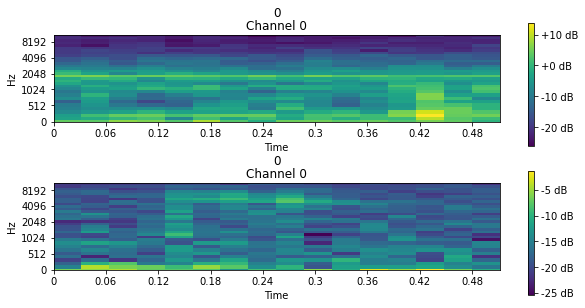

In [149]:
dbunch.show_batch(figsize=(10, 5))

We'll be using transfer learning from a `resnet18` model. Transfer learning has proved very [useful](https://builtin.com/data-science/transfer-learning#:~:text=Transfer%20learning%20has%20several%20benefits,needing%20a%20lot%20of%20data.)

In [150]:
learn = cnn_learner(dbunch, 
            models.resnet18,
            config=cnn_config(n_in=1), #<- Only audio specific modification here
            # config={"n_in":1},
            # loss_func=CrossEntropyLossFlat(),
            metrics=[F1Score()])

Here's a summary of the model we'll be using

In [ ]:
learn.summary()

Next we'll run the training loop with a `SaveModelCallback`. This will allow us to save the best model automatically. We'll be tracking f1 score since our classes are imbalanced.

In [174]:
from fastai.callback.tracker import SaveModelCallback
@skip_if_ci
def run_learner():
    # epochs are a bit longer due to the chosen melspectrogram settings
    learn.fine_tune(epochs = 10, cbs = [SaveModelCallback(monitor='f1_score', fname='stage-1')])

# We only validate the model when running in CI
run_learner()

epoch,train_loss,valid_loss,f1_score,time
0,0.215851,0.111404,0.857143,00:05


Better model found at epoch 0 with f1_score value: 0.8571428571428572.


epoch,train_loss,valid_loss,f1_score,time
0,0.214454,0.075332,0.842105,00:06
1,0.190387,0.077633,0.750000,00:06
2,0.173257,0.073499,0.900000,00:06
3,0.149740,0.041282,0.909091,00:06
4,0.128147,0.067507,0.750000,00:06
5,0.112061,0.081603,0.823529,00:06
6,0.105382,0.028485,0.947368,00:06
7,0.099579,0.028605,0.947368,00:06
8,0.089399,0.073818,0.888889,00:06
9,0.077783,0.014094,1.000000,00:06


Better model found at epoch 0 with f1_score value: 0.8421052631578948.
Better model found at epoch 2 with f1_score value: 0.9.
Better model found at epoch 3 with f1_score value: 0.9090909090909091.
Better model found at epoch 6 with f1_score value: 0.9473684210526316.
Better model found at epoch 9 with f1_score value: 1.0.


In [175]:
learn.load("stage-1")
learn.unfreeze()

# Prediction

Now we'll predict on the test set to see how we did. 

In [ ]:
# test_dl = dbunch.test_dl(test_df['file_name'].tolist())
# preds,y = learn.get_preds(dl=test_dl) 
# (returning decimal?)

In [178]:
# pred_df = pd.concat([test_df[['file_name', 'target']], pd.DataFrame(preds, columns=['prediction'])], axis=1)
# pred_df['prediction_cut_off'] = pred_df['prediction'].apply(lambda x: 1 if x > 0.5 else 0)
tqdm.pandas()
pred_df = test_df[['file_name', 'target']]
pred_df['prediction'] = pred_df['file_name'].progress_apply(lambda file: learn.predict(file)[0])
pred_df.rename(columns = {'target': 'actual'}, inplace = True)
pred_df.head()

,file_name,actual,prediction
0,test/three.wav,0,0
1,test/marvin.wav,0,0
2,test/cat.wav,0,0
3,test/yes.wav,0,0
4,test/up.wav,0,0


In [179]:
pred_df[(pred_df['actual']==1) & (pred_df['prediction']==1)].shape

(0, 3)

In [180]:
pred_df[(pred_df['prediction']==1)].shape

(0, 3)

In [181]:
pred_df[(pred_df['actual']==1)].shape

(941, 3)

In [182]:
from sklearn.metrics import f1_score
y_true = pred_df['actual'].tolist()
y_pred = pred_df['prediction_cut_off'].tolist()
f1_score(y_true = y_true, y_pred = y_pred)

KeyError: ignored

Pretty decent f1 score. But there's obviously room for improvement.

# Prediction on long-form audio sample
Finally we'll run our model on a longer form audio sample.

I'll be using a [clip](https://www.youtube.com/watch?v=I21ANMLvntQ&ab_channel=NetflixIsAJoke) from Tom Segura's comedy special. This contains a lot of swear words.

I'll be using parallel processing again here to really speed things up. 


In [44]:
!pip install youtube-dl

     |████████████████████████████████| 1.9MB 12.3MB/s 


In [45]:
!youtube-dl --extract-audio --audio-format wav https://www.youtube.com/watch?v=I21ANMLvntQ&ab_channel=NetflixIsAJoke

[youtube] I21ANMLvntQ: Downloading webpage
[download] Destination: Best Of - Tom Segura _ Netflix Is A Joke-I21ANMLvntQ.webm
[download] 100% of 5.45MiB in 00:00
[ffmpeg] Destination: Best Of - Tom Segura _ Netflix Is A Joke-I21ANMLvntQ.wav
Deleting original file Best Of - Tom Segura _ Netflix Is A Joke-I21ANMLvntQ.webm (pass -k to keep)


First we'll split the audio files into smaller segments. I've split things here into segments of about 0.2 seconds. That should be long enough to catch a swear word but short enough to not overwhelm the classifier. 

In [127]:
import shutil
from pydub import AudioSegment
import os

def _get_length_audio_in_ms(file):
  audio = AudioSegment.from_wav(file)
  return int(audio.duration_seconds * 1000)

def _splitter(i, file, folder, increment):
  t1 = i 
  t2 = i + increment
  output = Path(f'{folder}/audio_{i}{Path(file).suffix}')
  audio = AudioSegment.from_wav(file)
  audio[t1:t2].export(output, format=f'{Path(file).suffix[1:]}')
  
def split_audio_file(file, folder = 'output', increment = 1000):

  print(f'splitting audio files...')
  folder = Path(folder)
  if folder.exists(): 
    shutil.rmtree(folder)
  os.mkdir(folder)

  length_ms = _get_length_audio_in_ms(file)
  parallel(_splitter, range(0, length_ms, increment), file = file, folder = folder, increment = increment)
  # for i in range(0, length_miliseconds, increment):
  #   _splitter(i, file, folder, increment)
    
  files = glob.glob(f'{folder}/audio*{Path(file).suffix}')
  files = sorted(files, key = lambda x: int(str(Path(x).stem).split('_')[-1]))
  return files

In [126]:
seconds = 0.2
miliseconds = int(seconds * 1000)
files = split_audio_file('/content/Best Of - Tom Segura _ Netflix Is A Joke-I21ANMLvntQ.wav', 'output', miliseconds)

splitting audio files...


['output/audio_0.wav', 'output/audio_1000.wav', 'output/audio_2000.wav', 'output/audio_3000.wav', 'output/audio_4000.wav', 'output/audio_5000.wav', 'output/audio_6000.wav', 'output/audio_7000.wav', 'output/audio_8000.wav', 'output/audio_9000.wav', 'output/audio_10000.wav', 'output/audio_11000.wav', 'output/audio_12000.wav', 'output/audio_13000.wav', 'output/audio_14000.wav', 'output/audio_15000.wav', 'output/audio_16000.wav', 'output/audio_17000.wav', 'output/audio_18000.wav', 'output/audio_19000.wav', 'output/audio_20000.wav', 'output/audio_21000.wav', 'output/audio_22000.wav', 'output/audio_23000.wav', 'output/audio_24000.wav', 'output/audio_25000.wav', 'output/audio_26000.wav', 'output/audio_27000.wav', 'output/audio_28000.wav', 'output/audio_29000.wav', 'output/audio_30000.wav', 'output/audio_31000.wav', 'output/audio_32000.wav', 'output/audio_33000.wav', 'output/audio_34000.wav', 'output/audio_35000.wav', 'output/audio_36000.wav', 'output/audio_37000.wav', 'output/audio_38000.wav'

We can listen to the audio samples to check we're on track.

In [128]:
def play_audio(file):
  w, sr = torchaudio.load(file)
  # print(w.shape)
  print(file)
  return ipd.Audio(w.numpy(), rate=sr)

In [129]:
play_audio(files[0])

output/audio_0.wav


In [130]:
play_audio(files[1])

output/audio_1000.wav


Next we'll download a censor audio sound. I'm using [this one](https://www.youtube.com/watch?v=RPfCZhvj1Ng) from youtube.

In [56]:
!youtube-dl --extract-audio --audio-format wav https://www.youtube.com/watch?v=RPfCZhvj1Ng

[youtube] RPfCZhvj1Ng: Downloading webpage
[download] Destination: Censor Beep Sound Effect-RPfCZhvj1Ng.webm
[download] 100% of 30.44KiB in 00:00
[ffmpeg] Destination: Censor Beep Sound Effect-RPfCZhvj1Ng.wav
Deleting original file Censor Beep Sound Effect-RPfCZhvj1Ng.webm (pass -k to keep)


Now we'll get the model to run a prediction on each audio file. If the model believes that the audio file contains a swear word then it will automatically censor it using the audio sound we downloaded from youtube.

In [137]:
import ffmpy
from tqdm.notebook import trange

CENSOR_FILE = 'Censor Beep Sound Effect-RPfCZhvj1Ng.wav'
PREDICTION_FILE = 'Best Of - Tom Segura _ Netflix Is A Joke-I21ANMLvntQ.wav'

def bleep_out_swear_word(file):
  # return censored file which is the same length as original file
  ms = _get_length_audio_in_ms(file)
  output = _get_output_name(file, dir = 'bleeped_out')
  ffmpy.FFmpeg(inputs={str(CENSOR_FILE):''},\
               outputs={str(output): "-y -ss 00:00:00 -to 00:00:00."+str(ms)+' -c copy'}).run() 
  return output

def _stitch_files_helper(file, output):
  ffmpy.FFmpeg(inputs={str(file):"-y -loglevel warning"},\
               outputs={str(output): "-filter_complex amix=inputs=1:duration=first:dropout_transition=0"}).run()
  # !ffmpeg -loglevel warning -y -i output/audio200.wav -i output/audio400.wav -i output/audio600.wav -i output/audio800.wav -i output/audio0.wav -filter_complex [0:0][1:0][2:0][3:0][4:0]concat=n=1727:v=0:a=1[out] -map [out] output.wav

def _stitch_files_together(files, output_name = 'output.wav'):
  print(f'stitching files together...')
  # parallel(_stitch_files_helper, files[1:], output = output_name, n_workers = mp.cpu_count())

  # https://superuser.com/questions/587511/concatenate-multiple-wav-files-using-single-command-without-extra-file
  n = len(files)
  t = ''.join(['['+str(i)+':0]' for i in range(n)])
  ffmpy.FFmpeg(inputs={str(files[n-1]): "-y "+ " ".join(['-i ' + str(i) for i in files[:n-1]])},\
               outputs={str('output.wav'): "-filter_complex '"+str(t)+"concat=n="+str(n)+\
               ":v=0:a=1[out]' -map '[out]'"}).run()
    
  return output_name

def predict_long_form(file, seconds = 0.2, folder = 'output'):
  _delete_recreate('bleeped_out')
  miliseconds = int(seconds * 1000)
  files = split_audio_file(file, Path(folder), miliseconds)
  
  for i in trange(len(files)):
    pred = learn.predict(files[i])[0]
    print(f'swear word identified')
    if (pred == 1): files[i] = bleep_out_swear_word(files[i])

  output_name = _stitch_files_together(files)
  return output_name

output = predict_long_form(PREDICTION_FILE, seconds = 0.2)

splitting audio files...


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


swear word identified


KeyboardInterrupt: ignored

Cool let's listen and hear how it went. I ran into OOM issues when trying to play the entire file on jupyter notebook so I'll just embed a sample here. I'll put the full file on github. 

In [134]:
def play_sample_audio(file, duration_min = 0, duration_second = 20):
  new_name = Path(file).stem + '_sample' + Path(file).suffix
  ffmpy.FFmpeg(inputs={str(file): "-y "},\
               outputs={str(new_name): "-ss 00:00:00 -to 00:"+str(duration_min)+":"+str(duration_second)}).run()
  # !ffmpeg -y -loglevel warning -i $file -ss 00:00:00 -to 00:$duration_min:$duration_second -c copy $new_name
  return play_audio(new_name)

In [135]:
play_sample_audio('output.wav', duration_second = 30)

output_sample.wav


In [136]:
get_length_audio_in_miliseconds('output.wav')

NameError: ignored

# Experiments

### Lightning

In [ ]:
!pip install pytorch-lightning

In [ ]:
import pytorch_lightning as pl
import gc; gc.collect()
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score
from torchvision.models import vgg16

## Set up audio classifier ###
class Custom_Audio_Class(pl.LightningModule):
    def __init__(self, n_input, n_output, n_channel = 64, stride=16, lr = 1e-3):
        super().__init__()
        self.lr = lr
        self.save_hyperparameters()
        self.base_model = vgg16(pretrained=True)
        self.base_model.features[0] = nn.Conv2d(n_input, n_channel,  kernel_size=1, stride=1, padding = 2)
        self.fc1 = nn.Linear(1000, n_output)
        
    def forward(self,x):
        x = self.base_model(x)
        x = x.view(batch_size, -1)
        out = self.fc1(x)
        return out
    
    def cross_entropy_loss(self,logits,labels):
        criterion = nn.CrossEntropyLoss()
        return criterion(logits,labels)
    
    def training_step(self,train_batch,batch_idx):
        data, target = train_batch
        data = transform(data)
        
        # data = data.to(device)
        # target = target.to(device)

        # apply transform and model on whole batch directly on device
        data = transform(data)
        output = model(data)

        # negative log-likelihood for a tensor of size (batch x 1 x n_output)
        loss = F.nll_loss(output.squeeze(), target)
        return loss
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer


In [ ]:
model = Custom_Audio_Class(n_input=transformed.shape[0], n_output=len(labels))
trainer = pl.Trainer(gpus=1,max_epochs=1)
trainer.fit(model,train_loader)

/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: You have set progress_bar_refresh_rate < 20 on Google Colab. This may crash. Consider using progress_bar_refresh_rate >= 20 in Trainer.
  warnings.warn(*args, **kwargs)
GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type   | Params
--------------------------------------
0 | base_model | VGG    | 138 M 
1 | fc1        | Linear | 2.0 K 
--------------------------------------
138 M     Trainable params
0         Non-trainable params
138 M     Total params
/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:49: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings

RuntimeError: ignored